In [70]:
import glob
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties
from astropy.io import fits
from astropy.table import Table
from astropy.coordinates import SkyCoord
from astropy.nddata import Cutout2D
from astropy.wcs import WCS
from astropy.visualization import ImageNormalize, MinMaxInterval, ZScaleInterval, LogStretch
from astropy.visualization.wcsaxes import add_scalebar
import astropy.units as u
from grizli import utils

plt.rcParams['xtick.labelsize']='large'
plt.rcParams['ytick.labelsize']='large'
plt.rcParams['axes.labelsize']='x-large'
plt.rcParams['legend.fontsize']='large'
plt.rcParams['xtick.top']=True
plt.rcParams['ytick.right']=True
plt.rcParams['xtick.direction']='in'
plt.rcParams['ytick.direction']='in'
plt.rcParams['xtick.minor.visible']=True
plt.rcParams['ytick.minor.visible']=True
# %matplotlib ipympl

### Load catalogs

In [91]:
field = 'CEERS'
phot_dja = utils.read_catalog(glob.glob(f"/home/aurelien/DAWN/DJA_SE++/image/{field}/dja/*fix_phot_apcorr.fits")[0])
phot_sepp = Table(fits.open(glob.glob(f"/home/aurelien/DAWN/DJA_SE++/sepp/{field}/*sepp_cat.fits")[0])[1].data)

In [92]:
print(phot_dja.keys())
print(phot_sepp.keys())

['id', 'thresh', 'npix', 'tnpix', 'xmin', 'xmax', 'ymin', 'ymax', 'x', 'y', 'x2_image', 'y2_image', 'xy_image', 'errx2', 'erry2', 'errxy', 'a_image', 'b_image', 'theta_image', 'cxx_image', 'cyy_image', 'cxy_image', 'cflux', 'flux', 'cpeak', 'peak', 'xcpeak', 'ycpeak', 'xpeak', 'ypeak', 'flag', 'x_image', 'y_image', 'number', 'ra', 'dec', 'x_world', 'y_world', 'flux_iso', 'fluxerr_iso', 'area_iso', 'mag_iso', 'kron_radius', 'kron_rcirc', 'flux_auto', 'fluxerr_auto', 'bkg_auto', 'flag_auto', 'area_auto', 'flux_radius_flag', 'flux_radius_20', 'flux_radius', 'flux_radius_90', 'tot_corr', 'mag_auto', 'magerr_auto', 'flux_aper_0', 'fluxerr_aper_0', 'flag_aper_0', 'bkg_aper_0', 'mask_aper_0', 'flux_aper_1', 'fluxerr_aper_1', 'flag_aper_1', 'bkg_aper_1', 'mask_aper_1', 'flux_aper_2', 'fluxerr_aper_2', 'flag_aper_2', 'bkg_aper_2', 'mask_aper_2', 'f1000w_flux_aper_0', 'f1000w_fluxerr_aper_0', 'f1000w_flag_aper_0', 'f1000w_bkg_aper_0', 'f1000w_mask_aper_0', 'f1000w_flux_aper_1', 'f1000w_fluxerr_a

### Plot position of objects

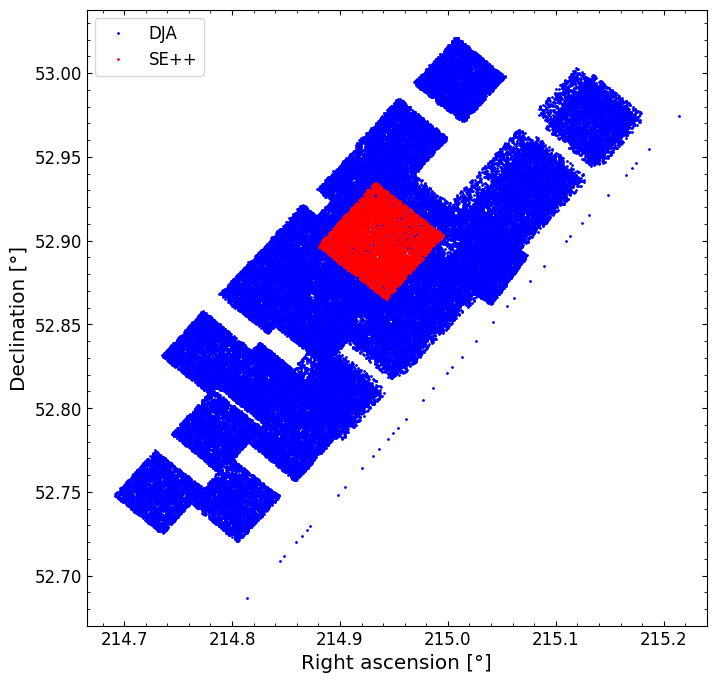

In [93]:
fig, ax = plt.subplots(figsize=(8,8))
ax.plot(phot_dja['ra'], phot_dja['dec'], marker='o', ls='', ms=1, c='b', label='DJA')
ax.plot(phot_sepp['world_centroid_alpha'], phot_sepp['world_centroid_delta'], marker='o', ls='', ms=1, c='r', label='SE++')
ax.set_xlabel('Right ascension [°]')
ax.set_ylabel('Declination [°]')
ax.legend()
plt.show()

### Cross match catalogs

In [94]:
coord_dja = SkyCoord(phot_dja['ra'], phot_dja['dec'])
coord_sepp = SkyCoord(phot_sepp['world_centroid_alpha']*u.degree, phot_sepp['world_centroid_delta']*u.degree)
idx, d2d, _ = coord_sepp.match_to_catalog_sky(coord_dja)

### Remove false matches

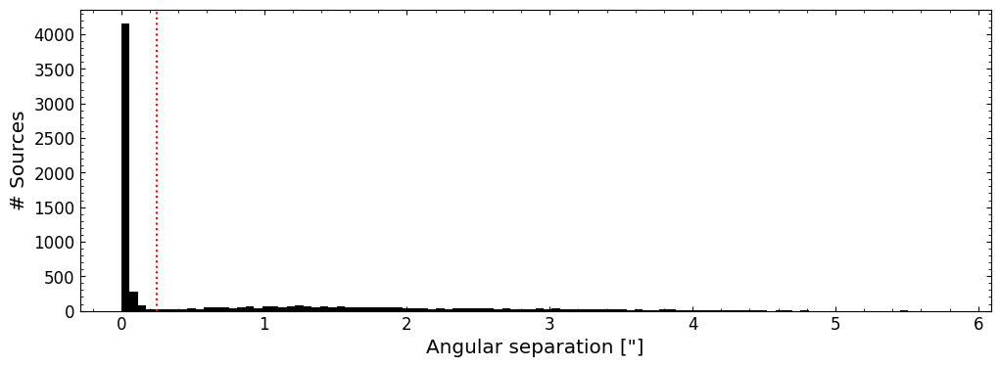

In [95]:
max_sep = 0.25*u.arcsec
phot_dja_match = phot_dja[idx][d2d<max_sep]
phot_sepp_match = phot_sepp[d2d<max_sep]

fig, ax = plt.subplots(figsize=(12,4))
ax.hist(d2d.to(u.arcsec), bins=100, color='k')
ax.axvline(max_sep.value, color='r', ls=':')
ax.set_xlabel('Angular separation ["]')
ax.set_ylabel('# Sources')
plt.show()

### Magnitude comparison

/tmp/ipykernel_13409/3543210510.py:35: RuntimeWarning: invalid value encountered in log10
  mag_dja = ZP - 2.5*np.log10(phot_dja_match[f'{filter}_tot_1']*1000)


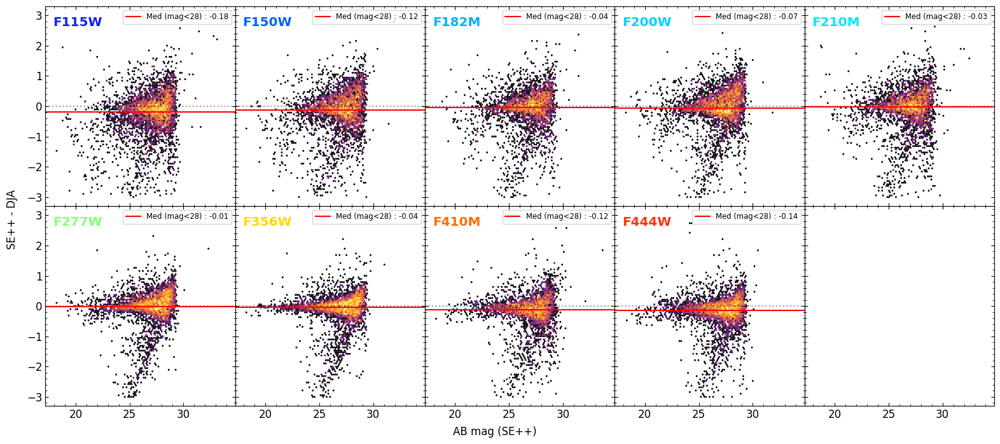

In [96]:
# filter_list = ['f090w', 'f115w', 'f150w', 'f182m', 'f200w', 'f210m', 'f277w', 'f335m', 'f356w', 'f410m', 'f444w']
# filter_list = ['f115w', 'f150w', 'f182m', 'f200w', 'f210m', 'f277w', 'f356w', 'f410m', 'f444w']
filter_list = [key.split("_")[-1].lower() for key in phot_sepp.keys() if (('MAG' in key) and ('err' not in key))]

color_dict = {'F090W':'#0000E3', 
              'F115W':'#1020FF',
              'F150W':'#0162FF',
              'F182M':'#00B1FF',
              'F200W':'#04D1FF',
              'F210M':'#02E8F4',
              'F277W':'#87FF7F',
              'F335M':'#EBFF0C',
              'F356W':'#FFD807',
              'F410M':'#FF6D03',
              'F444W':'#FF330C',}
channel_dict = {'F090W':'SW', 'F115W':'SW', 'F150W':'SW', 'F182M':'SW', 'F200W':'SW', 'F210M':'SW',
                'F277W':'LW', 'F335M':'LW', 'F356W':'LW', 'F410M':'LW', 'F444W':'LW',}
channel, count = np.unique([channel_dict[filter.upper()] for filter in filter_list], return_counts=True)
channel_count = dict(zip(channel, count))

w = channel_count[max(channel_count, key=channel_count.get)]
h = len(channel_count)

ZP = (1*u.nJy).to(u.ABmag).value

fig, axs = plt.subplots(h,w,figsize=(3*w+1,3*h+1), sharex=True, sharey=True, gridspec_kw = {'wspace':0, 'hspace':0})

for i, filter in enumerate(filter_list):
    if (len(channel_count)==2) & (channel_dict[filter.upper()]=="LW"):
        i += max(0, channel_count["LW"]-channel_count["SW"])
    ax = axs.flatten()[i] if type(axs)==np.ndarray else axs

    ax.axhline(0, color='k', alpha=0.4, ls=':')
    mag_sepp = ZP - 2.5*np.log10(phot_sepp_match[f'FLUX_MODEL_{filter.upper()}']*10)
    mag_dja = ZP - 2.5*np.log10(phot_dja_match[f'{filter}_tot_1']*1000)
    delta_28 = np.nanmedian((mag_sepp-mag_dja)[mag_sepp<28])

    ax.hexbin(mag_sepp, mag_sepp - mag_dja, mincnt=1, gridsize=100, cmap='inferno', bins='log', extent=(18,34,-3,3), lw=0.01)
    ax.axhline(delta_28, color='r', label=f"Med (mag<28) : {delta_28:.2f}")
    ax.text(0.04, 0.9, filter.upper(), transform=ax.transAxes, fontsize='x-large', fontweight='bold', color=color_dict[filter.upper()])
    ax.legend(loc='upper right', fontsize='small')

fig.supylabel("SE++ - DJA")
fig.supxlabel("AB mag (SE++)")
fig.tight_layout(rect=(0.01, -0.02, 1.0, 1.0))
# fig.savefig(f"/home/aurelien/DAWN/DJA_SE++/sepp/{field}/{field}_DJAvSEpp.pdf", bbox_inches='tight')
# fig.savefig(f"/home/aurelien/DAWN/DJA_SE++/sepp/{field}/{field}_DJAvSEpp.png", bbox_inches='tight', dpi=200)
plt.show()

### MAG_MODEL correction *(solved in new version of sepp_config.py)*

In [97]:
for filter in filter_list:
    offset = 2.41 if channel_dict[filter.upper()]=="LW" else 0.88
    phot_sepp_match[f"MAG_MODEL_{filter.upper()}"] = phot_sepp_match[f"MAG_MODEL_{filter.upper()}"] + offset

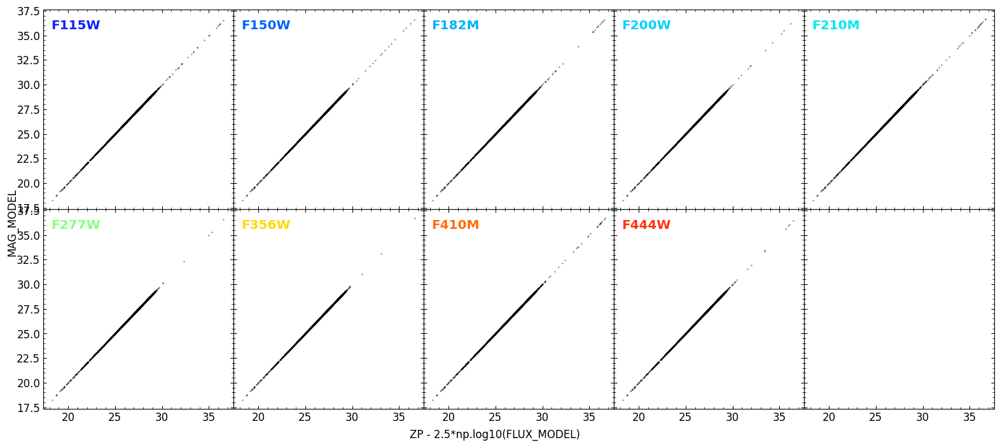

In [98]:
fig, axs = plt.subplots(h,w,figsize=(3*w+1,3*h+1), sharex=True, sharey=True, gridspec_kw = {'wspace':0, 'hspace':0})

for i, filter in enumerate(filter_list):
    if (len(channel_count)==2) & (channel_dict[filter.upper()]=="LW"):
        i += max(0, channel_count["LW"]-channel_count["SW"])
    ax = axs.flatten()[i] if type(axs)==np.ndarray else axs

    mag_sepp = ZP - 2.5*np.log10(phot_sepp_match[f'FLUX_MODEL_{filter.upper()}']*10)
    ax.scatter(mag_sepp, phot_sepp_match[f'MAG_MODEL_{filter.upper()}'], rasterized=True, color='k', s=0.1)

    ax.text(0.04, 0.9, filter.upper(), transform=ax.transAxes, fontsize='x-large', fontweight='bold', color=color_dict[filter.upper()])

fig.supxlabel("ZP - 2.5*np.log10(FLUX_MODEL)")
fig.supylabel("MAG_MODEL")
fig.tight_layout(rect=(0.01, -0.02, 1.0, 1.0))
plt.show()

### Morphological distributions

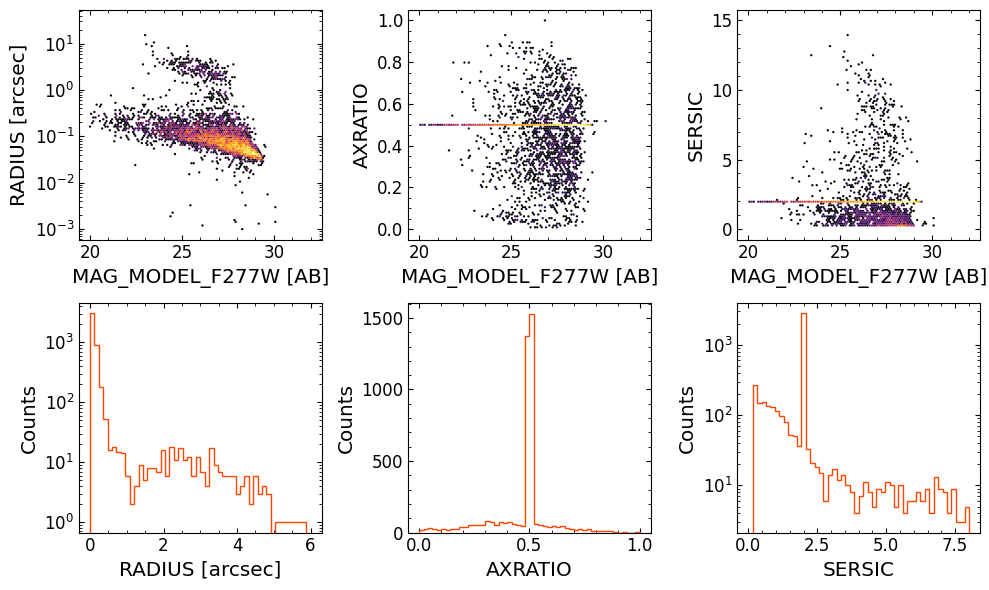

In [99]:
filter = 'f277w'
fig, axs = plt.subplots(2,3, figsize=(10,6))

axs[0,0].hexbin(phot_sepp_match[f'MAG_MODEL_{filter.upper()}'], phot_sepp_match['RADIUS']*3600, mincnt=1, gridsize=100, cmap='inferno', bins='log', yscale='log', extent=(20,32,-3,1.5), lw=0.01)
axs[0,0].set_xlabel(f"MAG_MODEL_{filter.upper()} [AB]")
axs[0,0].set_ylabel("RADIUS [arcsec]")

axs[0,1].hexbin(phot_sepp_match[f'MAG_MODEL_{filter.upper()}'], phot_sepp_match['AXRATIO'], mincnt=1, gridsize=100, cmap='inferno', bins='log', extent=(20,32,0,1), lw=0.01)
axs[0,1].set_xlabel(f"MAG_MODEL_{filter.upper()} [AB]")
axs[0,1].set_ylabel("AXRATIO")

axs[0,2].hexbin(phot_sepp_match[f'MAG_MODEL_{filter.upper()}'], phot_sepp_match['SERSIC'], mincnt=1, gridsize=100, cmap='inferno', bins='log', extent=(20,32,0,15), lw=0.01)
axs[0,2].set_xlabel(f"MAG_MODEL_{filter.upper()} [AB]")
axs[0,2].set_ylabel("SERSIC")

axs[1,0].hist(phot_sepp_match['RADIUS']*3600, bins=50, range=(0,6), histtype='step', log=True, color='orangered')
axs[1,0].set_xlabel("RADIUS [arcsec]")
axs[1,0].set_ylabel("Counts")

axs[1,1].hist(phot_sepp_match['AXRATIO'], bins=50, range=(0,1), histtype='step', log=False, color='orangered')
axs[1,1].set_xlabel("AXRATIO")
axs[1,1].set_ylabel("Counts")

axs[1,2].hist(phot_sepp_match['SERSIC'], bins=50, range=(0,8), histtype='step', log=True, color='orangered')
axs[1,2].set_xlabel("SERSIC")
axs[1,2].set_ylabel("Counts")

fig.tight_layout()
fig.savefig(f"/home/aurelien/DAWN/DJA_SE++/validation-images/6_SEpp-morphology/{field}_Sepp-morphology.png", bbox_inches='tight', dpi=200)
plt.show()

### `fmf_stop_reason` investigation

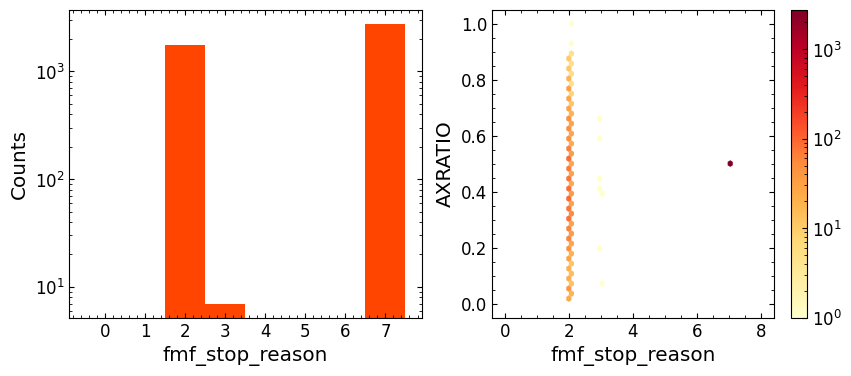

In [100]:
fig, axs = plt.subplots(1,2,figsize=(10,4))

axs[0].hist(phot_sepp_match['fmf_stop_reason'], bins=8, histtype='stepfilled', range=(-0.5,7.5), log=True, color='orangered')
axs[0].set_xticks(ticks=np.arange(0,7+1,1))
axs[0].set_xlabel("fmf_stop_reason")
axs[0].set_ylabel("Counts")

hex = axs[1].hexbin(phot_sepp_match['fmf_stop_reason'], phot_sepp_match['AXRATIO'], mincnt=1, gridsize=50, cmap='YlOrRd', bins='log', extent=(0,8,0,1), lw=0.01)
fig.colorbar(hex, ax=axs[1])
axs[1].set_xlabel("fmf_stop_reason")
axs[1].set_ylabel("AXRATIO")

plt.show()

In [101]:
# Remove fmf_stop_reason==7
phot_sepp_match_good = phot_sepp_match[phot_sepp_match['fmf_stop_reason']!=7]
phot_dja_match_good = phot_dja_match[phot_sepp_match['fmf_stop_reason']!=7]

### Morphological distrubtions without `fmf_stop_reason`==7

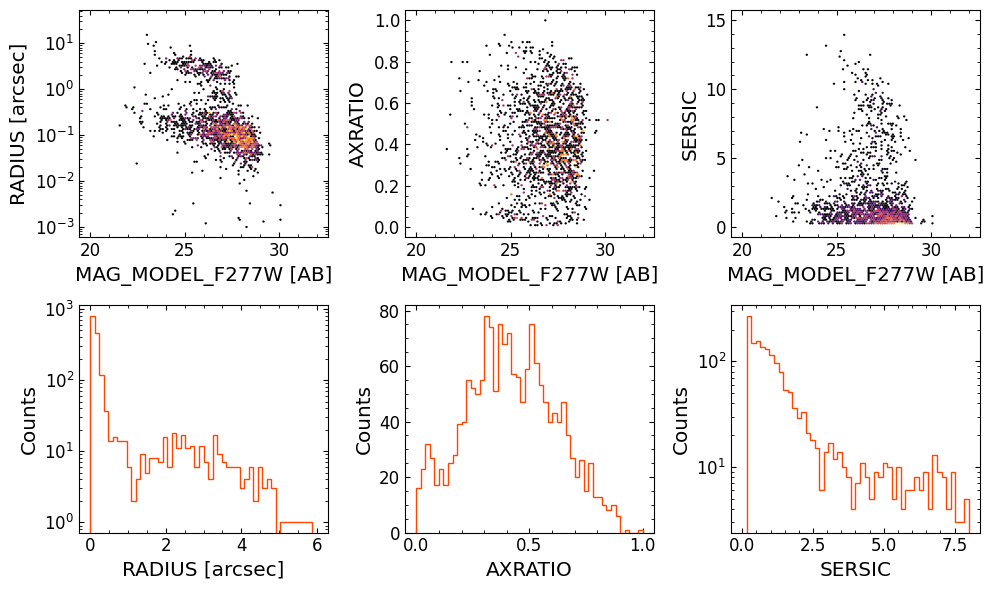

In [102]:
filter = 'f277w'
fig, axs = plt.subplots(2,3, figsize=(10,6))

axs[0,0].hexbin(phot_sepp_match_good[f'MAG_MODEL_{filter.upper()}'], phot_sepp_match_good['RADIUS']*3600, mincnt=1, gridsize=100, cmap='inferno', bins='log', yscale='log', extent=(20,32,-3,1.5), lw=0.01)
axs[0,0].set_xlabel(f"MAG_MODEL_{filter.upper()} [AB]")
axs[0,0].set_ylabel("RADIUS [arcsec]")

axs[0,1].hexbin(phot_sepp_match_good[f'MAG_MODEL_{filter.upper()}'], phot_sepp_match_good['AXRATIO'], mincnt=1, gridsize=100, cmap='inferno', bins='log', extent=(20,32,0,1), lw=0.01)
axs[0,1].set_xlabel(f"MAG_MODEL_{filter.upper()} [AB]")
axs[0,1].set_ylabel("AXRATIO")

axs[0,2].hexbin(phot_sepp_match_good[f'MAG_MODEL_{filter.upper()}'], phot_sepp_match_good['SERSIC'], mincnt=1, gridsize=100, cmap='inferno', bins='log', extent=(20,32,0,15), lw=0.01)
axs[0,2].set_xlabel(f"MAG_MODEL_{filter.upper()} [AB]")
axs[0,2].set_ylabel("SERSIC")

axs[1,0].hist(phot_sepp_match_good['RADIUS']*3600, bins=50, range=(0,6), histtype='step', log=True, color='orangered')
axs[1,0].set_xlabel("RADIUS [arcsec]")
axs[1,0].set_ylabel("Counts")

axs[1,1].hist(phot_sepp_match_good['AXRATIO'], bins=50, range=(0,1), histtype='step', log=False, color='orangered')
axs[1,1].set_xlabel("AXRATIO")
axs[1,1].set_ylabel("Counts")

axs[1,2].hist(phot_sepp_match_good['SERSIC'], bins=50, range=(0,8), histtype='step', log=True, color='orangered')
axs[1,2].set_xlabel("SERSIC")
axs[1,2].set_ylabel("Counts")

fig.tight_layout()
fig.savefig(f"/home/aurelien/DAWN/DJA_SE++/validation-images/6_SEpp-morphology/{field}_Sepp-morphology-good.png", bbox_inches='tight', dpi=200)
plt.show()

### Strange diagonal population

In [103]:
# Strange population definition
filter = 'f150w'
strange = np.where((phot_sepp_match[f"MAG_MODEL_{filter.upper()}"] < 29) & \
                   (phot_sepp_match[f"MAG_MODEL_{filter.upper()}"] - (ZP-2.5*np.log10(phot_dja_match[f'{filter}_tot_1']*1000)) < -2))[0]

/tmp/ipykernel_13409/2286426113.py:4: RuntimeWarning: invalid value encountered in log10
  (phot_sepp_match[f"MAG_MODEL_{filter.upper()}"] - (ZP-2.5*np.log10(phot_dja_match[f'{filter}_tot_1']*1000)) < -2))[0]


/tmp/ipykernel_13409/3423666697.py:20: RuntimeWarning: invalid value encountered in log10
  mag_dja = ZP - 2.5*np.log10(phot_dja_match[f'{filter}_tot_1']*1000)


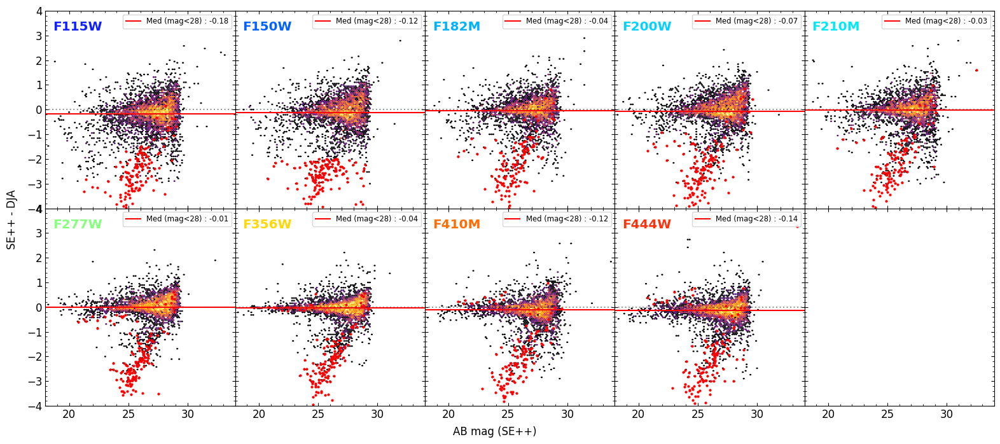

In [104]:
# filter_list = ['f090w', 'f115w', 'f150w', 'f182m', 'f200w', 'f210m', 'f277w', 'f335m', 'f356w', 'f410m', 'f444w']
# filter_list = ['f115w', 'f150w', 'f182m', 'f200w', 'f210m', 'f277w', 'f356w', 'f410m', 'f444w']
filter_list = [key.split("_")[-1].lower() for key in phot_sepp.keys() if (('MAG' in key) and ('err' not in key))]

channel, count = np.unique([channel_dict[filter.upper()] for filter in filter_list], return_counts=True)
channel_count = dict(zip(channel, count))

w = channel_count[max(channel_count, key=channel_count.get)]
h = len(channel_count)

fig, axs = plt.subplots(h,w,figsize=(3*w+1,3*h+1), sharex=True, sharey=True, gridspec_kw = {'wspace':0, 'hspace':0})

for i, filter in enumerate(filter_list):
    if (len(channel_count)==2) & (channel_dict[filter.upper()]=="LW"):
        i += max(0, channel_count["LW"]-channel_count["SW"])
    ax = axs.flatten()[i] if type(axs)==np.ndarray else axs

    ax.axhline(0, color='k', alpha=0.4, ls=':')
    mag_sepp = phot_sepp_match[f"MAG_MODEL_{filter.upper()}"]
    mag_dja = ZP - 2.5*np.log10(phot_dja_match[f'{filter}_tot_1']*1000)
    delta_28 = np.nanmedian((mag_sepp-mag_dja)[mag_sepp<28])

    ax.hexbin(mag_sepp, mag_sepp - mag_dja, mincnt=1, gridsize=100, cmap='inferno', bins='log', extent=(18,34,-3,3), lw=0.01)
    ax.plot(mag_sepp[strange], (mag_sepp-mag_dja)[strange], marker='o', ls='', ms=2, color='r')
    ax.set_xlim(18,34)
    ax.set_ylim(-4,4)
    ax.axhline(delta_28, color='r', label=f"Med (mag<28) : {delta_28:.2f}")
    ax.text(0.04, 0.9, filter.upper(), transform=ax.transAxes, fontsize='x-large', fontweight='bold', color=color_dict[filter.upper()])
    ax.legend(loc='upper right', fontsize='small')

fig.supylabel("SE++ - DJA")
fig.supxlabel("AB mag (SE++)")
fig.tight_layout(rect=(0.01, -0.02, 1.0, 1.0))
plt.show()

In [105]:
def show_source(id, cat, field):
    target = SkyCoord(cat['world_centroid_alpha'][id], cat['world_centroid_delta'][id], frame='icrs', unit='deg')
    size = u.Quantity((3.3,3.3), u.arcsec)

    def add_good_scalebar(ax, wcs, color='white', fraction=0.25):
        width = abs(wcs.pixel_scale_matrix[0,0]*wcs.pixel_shape[0])*u.degree
        good_values = [0.5*u.arcsec, 1*u.arcsec, 2*u.arcsec, 3*u.arcsec, 5*u.arcsec, 10*u.arcsec, 20*u.arcsec,
                    0.5*u.arcmin, 1*u.arcmin, 2*u.arcmin, 3*u.arcmin, 5*u.arcmin, 10*u.arcmin, 20*u.arcmin,
                    0.5*u.degree, 1*u.degree, 2*u.degree, 5*u.degree, 10*u.degree]
        dist = np.array([(fraction*width-val).value for val in good_values])
        dist[dist<0] = np.inf
        size = good_values[np.argmin(dist)]
        add_scalebar(ax, size, label=f"{size:latex}", color=color, fontproperties=FontProperties(size='x-large'), label_top=True, pad=0.1)

    fig = plt.figure(figsize=(2*len(filter_list)+1,2*3+0.5))
    for i, filter in enumerate(filter_list):
        # Loads images
        hdu       = fits.open(glob.glob(f"/home/aurelien/DAWN/DJA_SE++/image/{field}/cutout/*{filter}*sci*.fits")[0], memmap=True)[0]
        model_hdu = fits.open(glob.glob(f"/home/aurelien/DAWN/DJA_SE++/sepp/{field}/checkimages/model*{filter}*.fits")[0], memmap=True)[0]
        resid_hdu = fits.open(glob.glob(f"/home/aurelien/DAWN/DJA_SE++/sepp/{field}/checkimages/resid*{filter}*.fits")[0], memmap=True)[0]
        wcs = WCS(hdu.header)
        # Cutouts in images
        cutout       = Cutout2D(hdu.data,       position=target, size=size, wcs=wcs)
        model_cutout = Cutout2D(model_hdu.data, position=target, size=size, wcs=wcs)
        resid_cutout = Cutout2D(resid_hdu.data, position=target, size=size, wcs=wcs)
        #Plots data
        ax = fig.add_subplot(3,len(filter_list),i+1, projection=cutout.wcs)
        norm = ImageNormalize(cutout.data, interval=ZScaleInterval())
        # norm = ImageNormalize(cutout.data, interval=MinMaxInterval(), stretch=LogStretch())
        ax.imshow(cutout.data, cmap='gray', origin='lower', norm=norm)
        add_good_scalebar(ax, cutout.wcs, fraction=1.0)
        ax.set_title(filter.upper(), fontsize=24)
        ax.set_axis_off()
        # Plots model
        ax_model = fig.add_subplot(3,len(filter_list),i+len(filter_list)+1, projection=cutout.wcs)
        ax_model.imshow(model_cutout.data, cmap='gray', origin='lower', norm=norm)
        ax_model.set_axis_off()
        # Plots residual
        ax_resid = fig.add_subplot(3,len(filter_list),i+2*len(filter_list)+1, projection=cutout.wcs)
        ax_resid.imshow(resid_cutout.data, cmap='gray', origin='lower', norm=norm)
        ax_resid.set_axis_off()
    plt.figtext(1.0, 0.79, "Data", figure=fig, va='center', ha='left', rotation='vertical', fontsize='xx-large')
    plt.figtext(1.0, 0.48, "Model", figure=fig, va='center', ha='left',rotation='vertical', fontsize='xx-large')
    plt.figtext(1.0, 0.17, "Residual", figure=fig, va='center', ha='left',rotation='vertical', fontsize='xx-large')
    plt.figtext(0.0, 0.48, f"Source #{id}", figure=fig, va='center', ha='right', rotation='vertical', fontsize=24)
    fig.tight_layout()
    plt.show()

/home/aurelien/miniforge3/envs/dawn/lib/python3.9/site-packages/astropy/visualization/mpl_normalize.py:179: RuntimeWarning: divide by zero encountered in divide
  np.true_divide(values, self.vmax - self.vmin, out=values)
/home/aurelien/miniforge3/envs/dawn/lib/python3.9/site-packages/astropy/visualization/mpl_normalize.py:179: RuntimeWarning: invalid value encountered in divide
  np.true_divide(values, self.vmax - self.vmin, out=values)


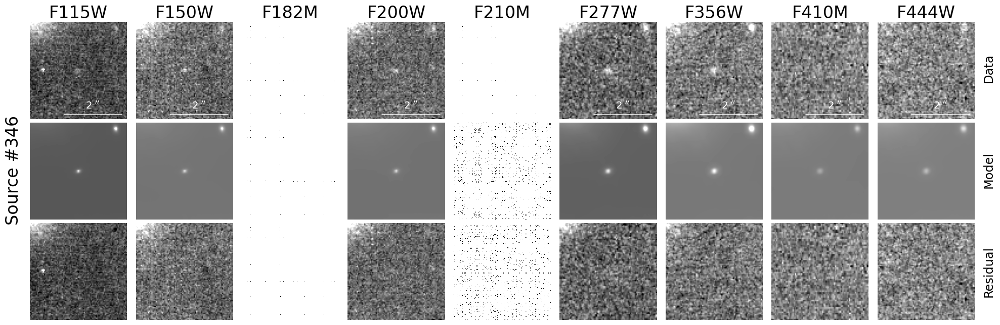

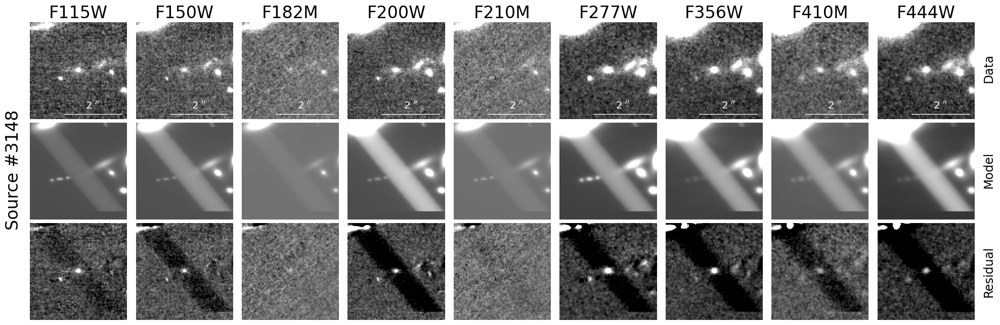

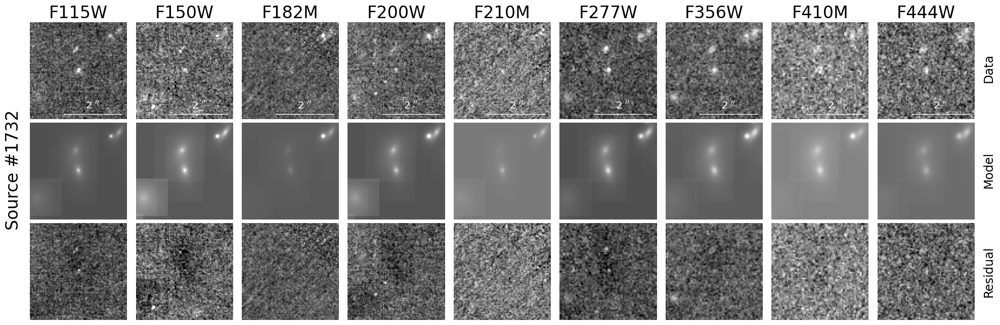

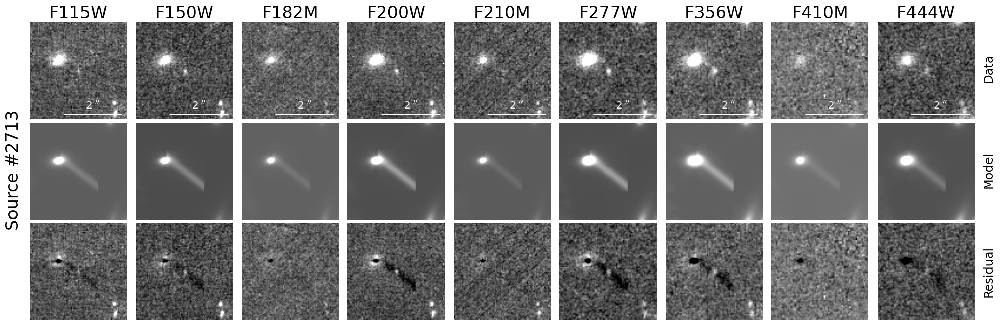

/home/aurelien/miniforge3/envs/dawn/lib/python3.9/site-packages/astropy/visualization/mpl_normalize.py:179: RuntimeWarning: divide by zero encountered in divide
  np.true_divide(values, self.vmax - self.vmin, out=values)
/home/aurelien/miniforge3/envs/dawn/lib/python3.9/site-packages/astropy/visualization/mpl_normalize.py:179: RuntimeWarning: invalid value encountered in divide
  np.true_divide(values, self.vmax - self.vmin, out=values)


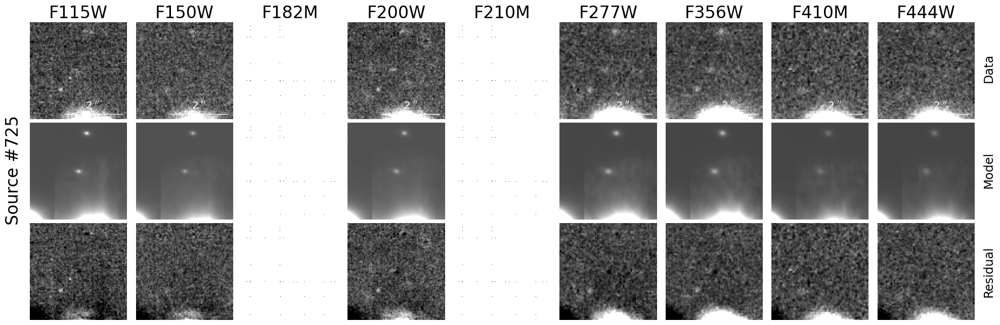

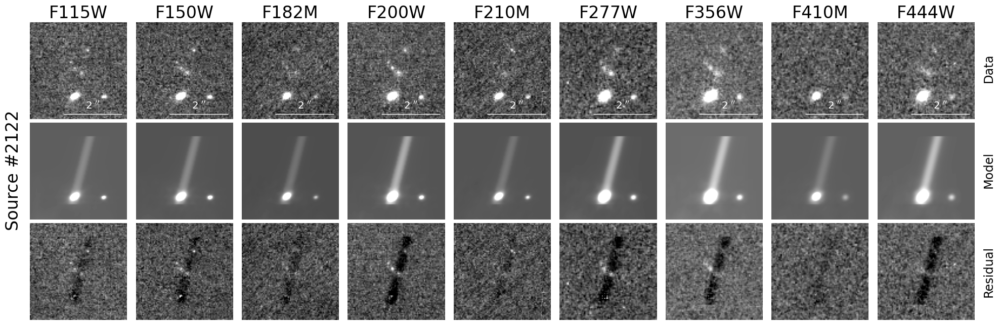

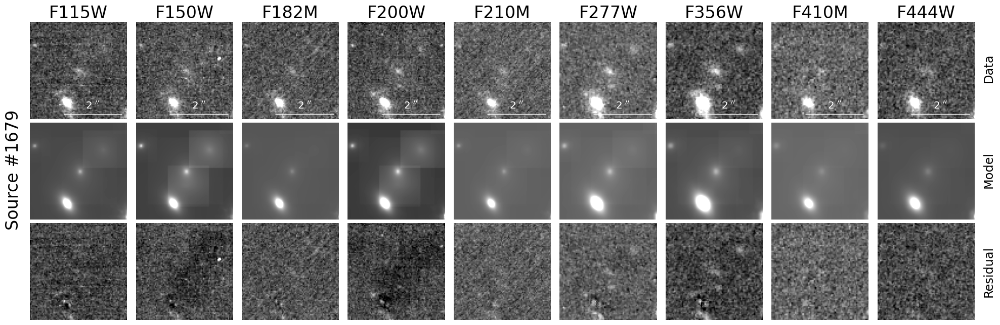

/home/aurelien/miniforge3/envs/dawn/lib/python3.9/site-packages/astropy/visualization/mpl_normalize.py:179: RuntimeWarning: divide by zero encountered in divide
  np.true_divide(values, self.vmax - self.vmin, out=values)
/home/aurelien/miniforge3/envs/dawn/lib/python3.9/site-packages/astropy/visualization/mpl_normalize.py:179: RuntimeWarning: invalid value encountered in divide
  np.true_divide(values, self.vmax - self.vmin, out=values)


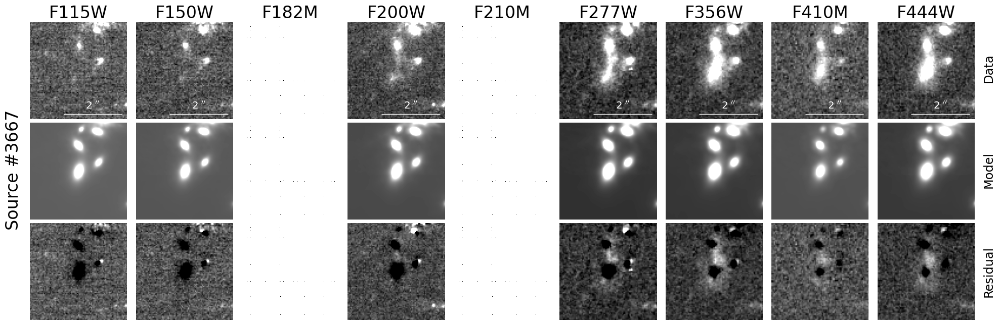

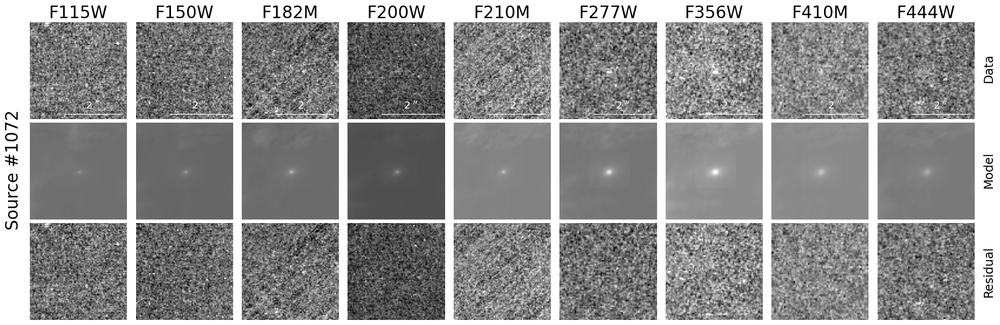

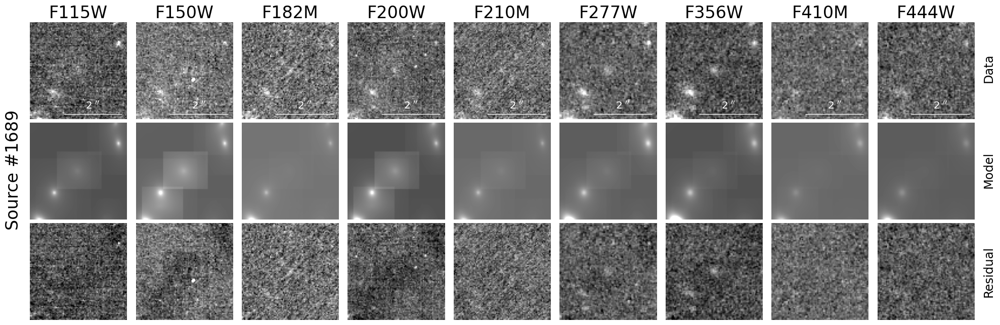

In [106]:
strange_targets = np.random.choice(strange, 10)
for id in strange_targets:
    show_source(id, phot_sepp_match, field)